<a href="https://colab.research.google.com/github/njqm10/ProgrammingProjects/blob/main/DeepSong.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Creating a Song with Deep Learning and Recurrent Neural Networks


<p align="justify"><i>Important disclaimer: The idea and the resources used for this project (data sets and base code) are MIT intelectual property. By no means do I intend to pass their idea, base code or data sets as my own. The solution to the the code however, is mine and was thought by me. Basically, MIT provided the data sets and the problem. I simply solved it on my own way. Additionally, the report was handwritten by me to present it in this portofolio.
© MIT 6.S191: Introduction to Deep Learning
# http://introtodeeplearning.com</i></p>

<hr>

<p align="justify">
Note: I recommend running this project on google colab to hear the generated music. Also, please <b>ENABLE GOOGLE COLAB GPU</b>.</p>

<p align="justify">
In this project, we are going to be using a Recurrent Neural Network (RNN) based generative model to create a song. There are a few good reasons why we choose an RNN over other types of structures (namely feed-forward). These reasons boil down to the regular advantages of using an RNN. Some of this reasons are:</p>

*   The capacity of RNNs to have **memory-like** capabilities. This will be extremely useuful for this task. Our Neural Network (NN) will be capable of "remembering" patterns presented on training songs to generate new ones. 
*   It is extremely advantageous and practical to be able to work with a variable input. Feed-Forward Neural Networks cannot do this, RNNs, due to their very own nature, can. Not every song in our training set will be of the same length, so having a variable input is a good thing.

<p align="justify">We will be using a data set provided and collected by MIT in their MIT 6.S191 package. This data set consists of Folk Irish songs.</p>

<hr>





In [ ]:
#We will import and download the required packages and dependencies in this chunck of code
import tensorflow as tf #To create our NN
import numpy as np #For mathematical facilities
import os #For computer related methods
import time #For time handling
import functools #For higher order functions
from IPython import display as ipythondisplay 
from tqdm import tqdm #For loading bars

#Installing MIT data set
!pip install mitdeeplearning #Data set install and import
import mitdeeplearning as mdl
#abcmidi timidity is to run abc notation without the need of a synthesizer
!apt-get install abcmidi timidity > /dev/null 2>&1 

     |████████████████████████████████| 2.1MB 8.1MB/s 
  Created wheel for mitdeeplearning: filename=mitdeeplearning-0.1.2-cp36-none-any.whl size=2114587 sha256=94c9a6095929d6ea5e9068f473af009ccc85e513e4cf0d95937bd2fe3ed5a783
  Stored in directory: /root/.cache/pip/wheels/27/e1/73/5f01c787621d8a3c857f59876c79e304b9b64db9ff5bd61b74
Successfully built mitdeeplearning


### Data set
Now we are going to be inspecting and formating our data set.

In [ ]:
#Now we are going to load the songs from the data set
songs = mdl.lab1.load_training_data()

Found 816 songs in text


In [ ]:
#We run the first element of the songs iterable to analyze the data set
example_song = songs[2]
print("\nExample song: ")
print(example_song)


Example song: 
X:4
T:Blackbird
Z: id:dc-hornpipe-4
M:C|
L:1/8
K:D Mixolydian
AG|F2FA GFD2|de (3fed d^cAF|G2GF GFDE|FdcA G2AG|!
F2FA GFD2|de (3fed d^cAG|AdcA GcAG|F2D2 D2:|!
fg|agfa gfeg|fd e^c d=cA2|agfa gfde|fdgf e2 fg|!
a2ge f3e|d^cde fdAG|AdcA GcAG|F2D2 D2:|!


We can use the built-in MIT function "play_song()" to translate the ABC notation into hearable music.




In [ ]:
# Convert the ABC notation to audio file and listen to it
mdl.lab1.play_song(example_song)

#### Numerical Values to our Notation
<p align="justify">It is important, that we transform our input to be in a usable format for a Neural Network. Let us remember, that Neural Networks work on mathematical functions and linear algebra. Therefore, using plain "strings" as our input does not make sense (you cannot apply mathematical functions to strings.) Therefore, we need to "encode" our characters or strings into numbers. To do so, we are simply going to assing an specific value to every <i>unique</i> character in the ABC format. </p>

>
<p align="justify">Having said that, we first need to join every single song into one single, massive string. We do this, in order to easily obtain the <i>unique</i> characters in the notation.</p>

In [ ]:
#Joining every song loaded in the "songs" data set
songs_joined = "\n\n".join(songs) # A \n will seperate every main category
                                  #This categories being X,T,Z...

Now, we can set to get all te unique values. We will also sort to get this characters in order.

In [ ]:
#Setting and sorting
vocab=sorted(set(songs_joined))
print("There are", len(vocab), "unique characters in the dataset")

There are 83 unique characters in the dataset


Now we can create our special code or value for each unique character

In [ ]:
### Define numerical representation of text ###

# Create a mapping from character to unique index.
# For example, to get the index of the character "d", 
# We can evaluate `char2idx["d"]`.  
char2idx = {u:i for i, u in enumerate(vocab)}
# Create a mapping from indices to characters. This is
#   the inverse of char2idx and allows us to convert back
#   from unique index to the character in our vocabulary.
idx2char={u:i for u,i in enumerate(vocab)}

In [ ]:
#We can demonstrate that we have mapped it correctly with a sliced dictionary
print('{')
for char,_ in zip(char2idx, range(20)):
    print('  {:4s}: {:3d},'.format(repr(char), char2idx[char]))
print('  ...\n}')

{
  '\n':   0,
  ' ' :   1,
  '!' :   2,
  '"' :   3,
  '#' :   4,
  "'" :   5,
  '(' :   6,
  ')' :   7,
  ',' :   8,
  '-' :   9,
  '.' :  10,
  '/' :  11,
  '0' :  12,
  '1' :  13,
  '2' :  14,
  '3' :  15,
  '4' :  16,
  '5' :  17,
  '6' :  18,
  '7' :  19,
  ...
}


Now we are tasked with vectorizing our songs_joined. We have to map every symbol in our string to its id.

In [ ]:
'''TODO: Write a function to convert the all songs string to a vectorized
    (i.e., numeric) representation. Use the appropriate mapping
    above to convert from vocab characters to the corresponding indices.

  NOTE: the output of the `vectorize_string` function 
  should be a np.array with `N` elements, where `N` is
  the number of characters in the input string
'''

def vectorize_string(string):
  vector_list=[]
  for i in string:
    vector_list.append(char2idx[i])
  vectorized_np=np.array(vector_list)
  return vectorized_np

vectorized_songs = vectorize_string(songs_joined)

We can see our answer is correct using the following code:

In [ ]:
print ('{} ---- characters mapped to int ----> {}'.format(repr(songs_joined[:10]), vectorized_songs[:10]))
# check that vectorized_songs is a numpy array
assert isinstance(vectorized_songs, np.ndarray), "returned result should be a numpy array"

'X:2\nT:An B' ---- characters mapped to int ----> [49 22 14  0 45 22 26 69  1 27]


#### Create Training Sets Using Batches

<p align="justify">The method we will be using depends on a couple parameters. These will be "seq_length" and "batch_size". Our RNN will work the following way: We divide our songs_joined into "batch_size" chunks of text with legth seq_length+1. Additionally, we wish to predict a substring of length seq_length moved one unit. The example provided in the exercise's prompt will clarify this easily. Let us say that our test is "Hello". Let us also set Seq_length to be 4. Therefore, our RNN should receive "Hell" and output "ello". Now we do this for the whole songs_joined string. This step is extremely important, as we our creating our training sets</p>

In [ ]:
### Batch definition to create training examples ###

def get_batch(vectorized_songs, seq_length, batch_size):
  # the length of the vectorized songs string minus 1
  #the one is explained do to the shift between input and output
  n = vectorized_songs.shape[0] - 1
  # randomly choose the starting indices for the examples in the training batch
  #idx will be of length "batch_size"
  idx = np.random.choice(n-seq_length, batch_size)

  '''TODO: construct a list of input sequences for the training batch'''
  input_batch = [vectorized_songs[i:i+seq_length] for i in idx]
  '''TODO: construct a list of output sequences for the training batch'''
  output_batch = [vectorized_songs[i+1:i+seq_length+1] for i in idx]

  # x_batch, y_batch provide the true inputs and targets for network training
  x_batch = np.reshape(input_batch, [batch_size, seq_length])
  y_batch = np.reshape(output_batch, [batch_size, seq_length])
  return x_batch, y_batch

  # Provided code to test our function 
test_args = (vectorized_songs, 10, 2)
if not mdl.lab1.test_batch_func_types(get_batch, test_args) or \
   not mdl.lab1.test_batch_func_shapes(get_batch, test_args) or \
   not mdl.lab1.test_batch_func_next_step(get_batch, test_args): 
   print("======\n[FAIL] could not pass tests")
else: 
   print("======\n[PASS] passed all tests!")

[PASS] test_batch_func_types
[PASS] test_batch_func_shapes
[PASS] test_batch_func_next_step
[PASS] passed all tests!


###Understanding and Creating the RNN

<p align="justify"> We have already creted our batches function. Now, we can confidently create our batches for taining and finally creating the RNN. To create our specific data (Defining the batch size), we need to understand a couple of things on how RNNs work.</p>

<p align="justify">As said before, RNNs have the capacity to handle variable inputs. But how does it do this? Well, it does it by looping over instances of time. For example, at time step 0, in a training set with batch size 1, the only available input will be the first character given in the training string of length "seq_string". At this initial time step, there is only one input. At time step 1 (Note that when we are talking about time, we are actualling referring to the loop over the training string), the RNN will recieve another single input, this being the second character on our string (However, due to the memory capacity associated with RNNs, it will still receive information from time step 0 without taking it as input.) The RNN will therefore output the prediction using these time steps as information.</p>

<p align="justify">The following image can serve a visual understanding of the looping involved in RNNS:</p>

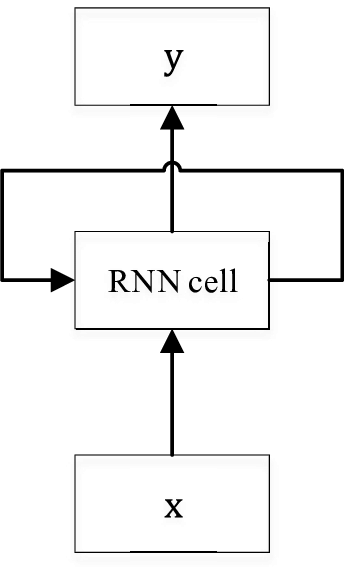



<p align="justify">And this image would be the unfolded (or "time dependent") version of this same RNN:</p>

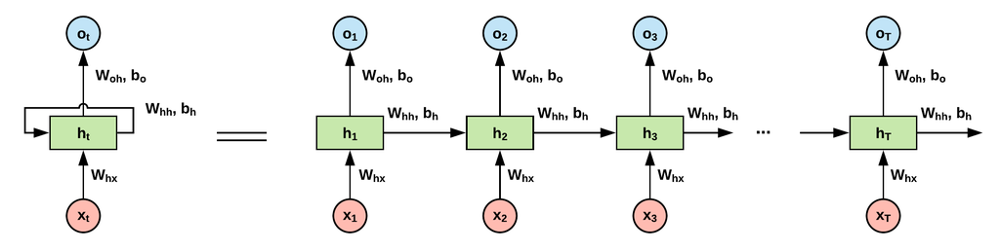

<hr>
<p align="justify"> Now we have to talk about the other important characteristic of RNNs. RNNs have the capacity of having some sort of memory without using it as direct input (it could be considered input of some sort however, but not in the traditional way Neural Networks receive inputs.)</p>

<p align="justify">We could think of it with a simple example. Imagine you are casually walking down an Australian street and you look at the following sign:</p>

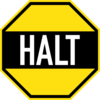

<p align="justify">Now, you might not be Australian, and maybe you have never seen a traffic sign like this one. However, it would not be hard for you to identify this sign as a stop sign. We can do this, because we have <i> memory </i>. When we see this sign, we receive an input. This input is the exact image we are seeing, nothing more. If we only used this information to make our prediction, it would probably lead to a very bad prediction. However, we have memory. Memory, while not beeing part of this explicit input, will help us make a more accurate prediction. For example, you have seen that shape before, you know the word halt means something similar to stop and so on. So, even if not direct input it is as helpful, if not more than the input itself.</p>

<p align="justify">Now, how does an RNN do this? Well, the answer is in the form of the cells themselves. This type of cell is called a gated cell. We will not go into detail on the architecture of the cell, but we will simply use it. The type of cell we are going to be using is callede LSTM (Long short term memory). LSTM also helps us to solve backpropagation issues associated with gradient descent.</p>

<p align="justify">An LSTM looks the following way:</p>

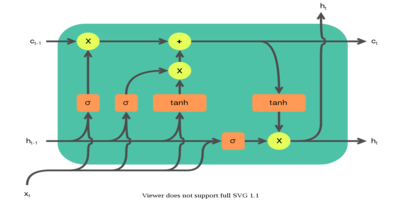

<p align="justify">No deep understanding is needed. The LSTM gate cell, uses tanh as its activation function. An LSTM can: Forget, Store, Update, and Output.</p>

Now we can finally create our Sequential Model for our Neural Network


In [ ]:
def LSTM(rnn_units): #We first define our type of LSTM cell, to later call
#the function when we need it
  return tf.keras.layers.LSTM(
    rnn_units, #Number of units or cells
    return_sequences=True, 
    recurrent_initializer='glorot_uniform', #Parameter preferences
    recurrent_activation='sigmoid', #Parameter preferences
    stateful=True,
  )

Now we build our model with the other layers as well

In [ ]:

'''TODO: Add LSTM and Dense layers to define the RNN model using the Sequential API.'''
def build_model(vocab_size, embedding_dim, rnn_units, batch_size):
  model = tf.keras.Sequential([
    # Layer 1: Embedding layer to transform indices into dense vectors 
    #   of a fixed embedding size, basically our input
    tf.keras.layers.Embedding(vocab_size, embedding_dim, batch_input_shape=[batch_size, None]),

    # Layer 2: LSTM with `rnn_units` number of units. 
    # TODO: Call the LSTM function defined above to add this layer.
    LSTM(rnn_units),
    # Layer 3: Dense (fully-connected) layer that transforms the LSTM output
    #   into the vocabulary size. 
    # TODO: Add the Dense layer.
    tf.keras.layers.Dense(vocab_size) #Basically our output
  ])

  return model

An now we are going to define some parameters for the training of our NN. We can chage these.

In [ ]:

# Optimization parameters:
num_training_iterations = 2000  # Increase this to train longer
batch_size = 4  # Experiment between 1 and 64
seq_length = 100  # Experiment between 50 and 500
learning_rate = 5e-3  # Experiment between 1e-5 and 1e-1

# Model parameters: 
vocab_size = len(vocab)
embedding_dim = 256 
rnn_units = 1024  # Experiment between 1 and 2048

# Checkpoint location: 
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "my_ckpt")

We define how our NN will learn with the step function. We will be using gradients to modify our weights. Gradients will be applied to the loss function.

In [ ]:
@tf.function
def step(x,y):
  with tf.GradientTape(persistent=True) as tape:
      y_pred=model(x)
      loss=tf.keras.losses.sparse_categorical_crossentropy(y,y_pred, from_logits=True)
  grads = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(grads, model.trainable_variables))

  return loss

Now we are going to be doing the function to train our RNN. Note that a loop will be necessary, because RNNs are loop dependent.

In [ ]:

def TrainModel(model,optimizer):
  history = []
  plotter = mdl.util.PeriodicPlotter(sec=2, xlabel='Iterations', ylabel='Loss')
  if hasattr(tqdm, '_instances'): tqdm._instances.clear() # clear if it exists

  for iter in tqdm(range(num_training_iterations)):
    
    #Train
    x_batch, y_batch = get_batch(vectorized_songs, seq_length, batch_size)
    loss = step(x_batch, y_batch)

    # Update the progress bar
    history.append(loss.numpy().mean())
    plotter.plot(history)

    # Update the model with the changed weights!
    if iter % 100 == 0:     
      model.save_weights(checkpoint_prefix)

  # Save the trained model and the weights
  model.save_weights(checkpoint_prefix)

Now we can make the function that predicts values with our trained RNN. Note that it runs a loop because it has to make various predictions. As a prediction is only 1 letter of a whole song.

In [ ]:
def GenerateSong(model,start_string,length):
  #We define our input string
  input_eval= [char2idx[char] for char in start_string]
  #We exapnd the dimensions of our list to accomodate with tensorlfow
  input_eval=tf.expand_dims(input_eval,0)

  generated_song=[]

  # Here batch size == 1
  model.reset_states()
  tqdm._instances.clear()

  for i in tqdm(range(length)):
    predictions=model(input_eval)
    predictions = tf.squeeze(predictions, 0)
    predicted_id = tf.random.categorical(predictions, num_samples=1)[-1,0].numpy()
    input_eval = tf.expand_dims([predicted_id], 0)
    generated_song.append(idx2char[predicted_id])
  return (start_string + ''.join(generated_song))

Now we actually train the RNN

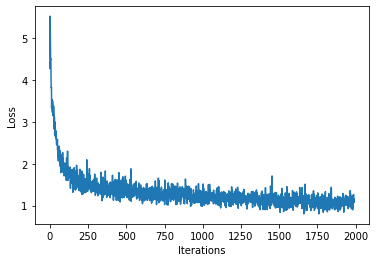

100%|██████████| 2000/2000 [04:07<00:00,  8.09it/s]


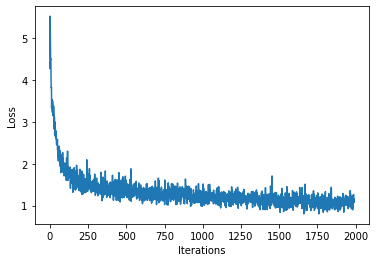

In [ ]:
model=build_model(vocab_size,embedding_dim,rnn_units,batch_size)
optimizer=tf.keras.optimizers.Adam(learning_rate)
TrainModel(model,optimizer)

Now we reload the trained RNN into a new model (batch size 1) to generate our song.

In [ ]:
model = build_model(vocab_size,embedding_dim,rnn_units, batch_size=1)
# Restore the model weights for the last checkpoint after training
model.load_weights(tf.train.latest_checkpoint(checkpoint_dir))
model.build(tf.TensorShape([1, None]))

We can finally generate some unique songs.
Important Note: For some reason, this code is bugged sometimes (I believe it is due to the extract_song_snippet provided by MIT) and sometimes, there is no generated songs found. To solve this, re-run this cell.

In [ ]:
generated_abc=GenerateSong(model, "X", 1000)
print(generated_abc)

generated_songs=mdl.lab1.extract_song_snippet(generated_abc)
for i, song in enumerate(generated_songs): 
  # Synthesize the waveform from a song
  waveform = mdl.lab1.play_song(song)

  # If its a valid song (correct syntax), lets play it! 
  if waveform:
    print("Generated song", i)
    ipythondisplay.display(waveform)